# Vector embedding-based change detection -- wildfires

In [1]:
!pip install pystac_client==0.6.1 stackstac==0.4.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 4.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 18.9 MB/s eta 0:00:00
  Attempting uninstall: pystac
    Found existing installation: pystac 1.6.1
    Uninstalling pystac-1.6.1:
      Successfully uninstalled pystac-1.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
rastervision-core 0.20.3.dev0 requires pygeos==0.13, which is not installed.
rastervision-core 0.20.3.dev0 requires geopandas==0.12.0, but you have geopandas 0.13.2 which is incompatible.
rastervision-core 0.20.3.dev0 requires imageio==2.22.1, but you have imageio 2.31.1 which is incompatible.
rastervision-core 0.20.3.dev0 requires nump

---

In [1]:
import gc
from time import perf_counter

from rastervision.core.box import Box
from rastervision.core.data import (
    MinMaxTransformer, RasterioCRSTransformer, 
    StatsTransformer, XarraySource)
from rastervision.core.data.raster_source import XarraySource

from rastervision.pipeline.file_system.utils import download_if_needed, json_to_file, file_to_json
from rastervision.core.data.utils import ensure_json_serializable
from rastervision.core import RasterStats
from rastervision.core.data import Scene
from rastervision.pytorch_learner import (
    SemanticSegmentationRandomWindowGeoDataset,
    SemanticSegmentationSlidingWindowGeoDataset)

import math
from tqdm.auto import tqdm, trange
import numpy as np
from shapely.geometry import mapping, Point
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import Normalize
import albumentations as A

from matplotlib import pyplot as plt
import seaborn as sns
sns.reset_defaults()

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

---

## Get time-series of Sentinel-2 images from STAC API

Get Sentinel-2 imagery from 2023-06-01 to 2023-06-20 over Paris, France.

In [2]:
import pystac_client
import stackstac

In [5]:
%%time

URL = "https://earth-search.aws.element84.com/v1"
catalog = pystac_client.Client.open(URL)

items = catalog.search(
    intersects=mapping(Point(-120.745, 39.006)),
    collections=["sentinel-2-l2a"],
    datetime="2017-01-01/2023-12-31",
    query={"eo:cloud_cover": {"lt": 5}},
).item_collection()
len(items)

CPU times: user 421 ms, sys: 22.2 ms, total: 444 ms
Wall time: 3.79 s


214

In [6]:
stack = stackstac.stack(items)
stack

<xarray.DataArray 'stackstac-a716f0095952ef43882ef3df1ca88a6b' (time: 214,
                                                                band: 32,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<fetch_raster_window, shape=(214, 32, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
  * time                                     (time) datetime64[ns] 2017-03-31...
    id                                       (time) <U24 'S2A_10SFJ_20170331_...
  * band                                     (band) <U12 'aot' ... 'wvp-jp2'
  * x                                        (x) float64 6e+05 ... 7.098e+05
  * y                                        (y) float64 4.4e+06 ... 4.29e+06
    view:sun_elevation                       (time) float64 52.2 69.35 ... 66.7
    ...                                       ...
    raster:bands                             (band) object [{'nodata': 0, 'da...
    gsd                                      (band) object None 10 ... None None
    common_name                              (band) object None 'blue' ... None
    center_wavelength                        (band) object None 0.49 ... None
    full_width_half_max                      (band) object None 0.098 ... None
    epsg                                     int64 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(600000.0, 4290240.0, 709800.0...
    crs:         epsg:32610
    transform:   | 10.00, 0.00, 600000.00|\n| 0.00,-10.00, 4400040.00|\n| 0.0...
    resolution:  10.0

### Convert to a Raster Vision `RasterSource`

In [7]:
data_array = stack
data_array = data_array.sel(
    band=[
        'coastal', # B01
        'blue', # B02
        'green', # B03
        'red', # B04
        'rededge1', # B05
        'rededge2', # B06
        'rededge3', # B07
        'nir', # B08
        'nir08', # B8A
        'nir09', # B09
        'swir16', # B11
        'swir16', # B11
        'swir22', # B12
    ])
data_array.shape

(214, 13, 10980, 10980)

In [160]:
months = data_array['time.month']
mask = (months == 8) | (months == 9) | (months == 10)
data_array = data_array.sel(time=mask)
data_array

<xarray.DataArray 'stackstac-e9dccb182a653a1cc055bb303edd03f4' (time: 91,
                                                                band: 13,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<getitem, shape=(91, 13, 10980, 10980), dtype=float64, chunksize=(1, 2, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
  * time                                     (time) datetime64[ns] 2017-08-13...
    id                                       (time) <U24 'S2B_10SFJ_20170813_...
  * band                                     (band) <U12 'coastal' ... 'swir22'
  * x                                        (x) float64 6e+05 ... 7.098e+05
  * y                                        (y) float64 4.4e+06 ... 4.29e+06
    s2:high_proba_clouds_percentage          (time) object 0.117442 ... 0.940828
    ...                                       ...
    title                                    (band) <U31 'Coastal aerosol (ba...
    gsd                                      (band) object 60 10 10 ... 20 20 20
    common_name                              (band) object 'coastal' ... 'swi...
    center_wavelength                        (band) object 0.443 0.49 ... 2.19
    full_width_half_max                      (band) object 0.027 0.098 ... 0.242
    epsg                                     int64 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(600000.0, 4290240.0, 709800.0...
    crs:         epsg:32610
    transform:   | 10.00, 0.00, 600000.00|\n| 0.00,-10.00, 4400040.00|\n| 0.0...
    resolution:  10.0

### Create the `RasterSource`

In [8]:
crs_transformer = RasterioCRSTransformer(
    transform=stack.transform, image_crs=stack.crs)
# bbox_pixel = crs_transformer.map_to_pixel(bbox).normalize()

In [9]:
x, y = list(crs_transformer.map_to_pixel(Point(-120.745, 39.006)).coords)[0]
valid_ts, _ = np.where(~np.isnan(data_array.isel(x=int(x), y=int(y), band=[3]).to_numpy()))
data_array = data_array.isel(time=valid_ts)
data_array

<xarray.DataArray 'stackstac-a716f0095952ef43882ef3df1ca88a6b' (time: 214,
                                                                band: 13,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<getitem, shape=(214, 13, 10980, 10980), dtype=float64, chunksize=(1, 2, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
  * time                                     (time) datetime64[ns] 2017-03-31...
    id                                       (time) <U24 'S2A_10SFJ_20170331_...
  * band                                     (band) <U12 'coastal' ... 'swir22'
  * x                                        (x) float64 6e+05 ... 7.098e+05
  * y                                        (y) float64 4.4e+06 ... 4.29e+06
    view:sun_elevation                       (time) float64 52.2 69.35 ... 66.7
    ...                                       ...
    raster:bands                             (band) object None None ... None
    gsd                                      (band) object 60 10 10 ... 20 20 20
    common_name                              (band) object 'coastal' ... 'swi...
    center_wavelength                        (band) object 0.443 0.49 ... 2.19
    full_width_half_max                      (band) object 0.027 0.098 ... 0.242
    epsg                                     int64 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(600000.0, 4290240.0, 709800.0...
    crs:         epsg:32610
    transform:   | 10.00, 0.00, 600000.00|\n| 0.00,-10.00, 4400040.00|\n| 0.0...
    resolution:  10.0

In [10]:
stats_tf = StatsTransformer.from_stats_json('SSL4EO_stats.json')

In [11]:
raster_source = XarraySource(
    data_array,
    crs_transformer=crs_transformer,
    raster_transformers=[stats_tf],
    # bbox=bbox_pixel,
    temporal=True
)
raster_source.shape

(214, 10980, 10980, 13)

In [12]:
T = raster_source.shape[0]
t_strs = np.array([str(_t.date()) for _t in raster_source.data_array.time.to_series().to_list()])

In [152]:
window = Box(xmin=x-250, xmax=x+250, ymin=y-250, ymax=y+250).to_int()
window.size

(500, 500)

  0%|          | 0/70 [00:00<?, ?it/s]

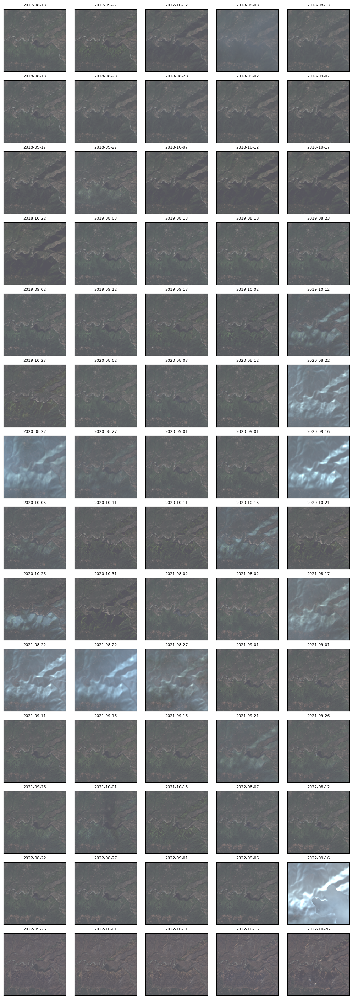

In [ ]:
plt.close('all')

skip = 1
ts = range(0, T, skip)
t_strs_ = t_strs[::skip]
# ts = np.where(non_cloudy_mask)[0]
# t_strs_ = t_strs[ts]

ncols = 5
nrows = int(math.ceil(len(ts) / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(ts, t_strs_, axs.flat), total=len(ts)) as bar:
    for i, (t, t_str_t, ax) in enumerate(bar):
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if i < len(axs.flat) - 1:
    for ax in axs.flat[i + 1:]:
        ax.axis('off')
plt.show()

In [154]:
sz = 1000
window = Box(xmin=x-(sz//2), xmax=x+(sz//2), ymin=y-(sz//2), ymax=y+(sz//2)).to_int()
window.size

(1000, 1000)

  0%|          | 0/91 [00:00<?, ?it/s]

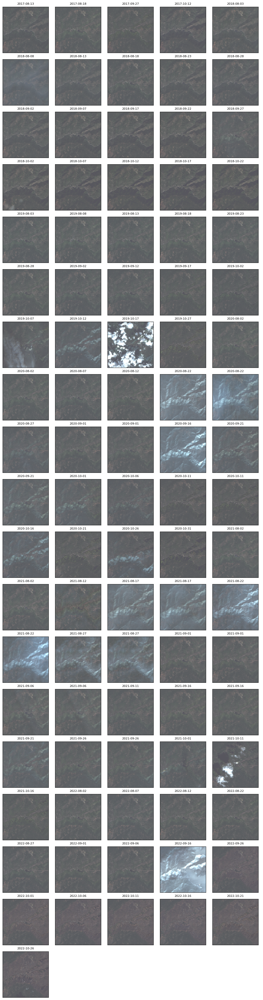

In [165]:
plt.close('all')

skip = 1
ts = range(0, T, skip)
t_strs_ = t_strs[::skip]
# ts = np.where(non_cloudy_mask)[0]
# t_strs_ = t_strs[ts]

ncols = 5
nrows = int(math.ceil(len(ts) / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(ts, t_strs_, axs.flat), total=len(ts)) as bar:
    for i, (t, t_str_t, ax) in enumerate(bar):
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if i < len(axs.flat) - 1:
    for ax in axs.flat[i + 1:]:
        ax.axis('off')
plt.show()

---

## Generate embeddings

### Get model

https://github.com/zhu-xlab/SSL4EO-S12

MoCo	ResNet18	S2-L1C 13 bands

In [16]:
from torch import nn
from torchvision.models import resnet18
from rastervision.pytorch_learner.utils import adjust_conv_channels

In [17]:
sd = torch.load('./B13_rn18_moco_0099_ckpt.pth')
sd_encoder_q = {k: v for k, v in sd['state_dict'].items() if (k.startswith('module.encoder_q') and not '.fc.' in k)}
sd_encoder_q_no_prefix = {k.replace('module.encoder_q.', ''): v for k, v in sd_encoder_q.items()}

In [18]:
model = resnet18(weights=None)
model.fc = nn.Identity()
model.conv1 = adjust_conv_channels(model.conv1, 13, pretrained=False)
model.load_state_dict(sd_encoder_q_no_prefix)
model = model.to(device=DEVICE)
model = model.eval()

---

### Run inference

In [19]:
def get_embedding(model: nn.Module, x: np.ndarray) -> np.ndarray:
    x = torch.from_numpy(x).float()
    x = x.permute(2, 0, 1).unsqueeze(0)
    x = x.to(device=DEVICE)
    out = model(x)
    out = out.cpu().numpy()
    return out

In [26]:
sz = 500
window = Box(xmin=x-(sz//2), xmax=x+(sz//2), ymin=y-(sz//2), ymax=y+(sz//2)).to_int()
window

Box(ymin=7767, xmin=9275, ymax=8267, xmax=9775)

In [ ]:
embeddings_train = []
embeddings_test = []

skip = 1
ts = range(0, T, skip)
t_strs_ = t_strs[::skip]

with tqdm(zip(ts, t_strs_), total=len(ts)) as bar, torch.inference_mode():
    for t, t_str in bar:
        chip_t = raster_source.get_chip(window, time=t)
        embedding_t = get_embedding(model, chip_t).squeeze()
        year, _, _ = t_str.split('-')
        year = int(year)
        if year < 2022:
            embeddings_train.append(embedding_t)
        else:
            embeddings_test.append(embedding_t)

embeddings_train = np.stack(embeddings_train)
embeddings_test = np.stack(embeddings_test)

In [23]:
embeddings_train.shape, embeddings_test.shape

((164, 512), (50, 512))

In [173]:
embeddings_json = dict(embeddings_train=embeddings_train, embeddings_test=embeddings_test)
json_to_file(ensure_json_serializable(embeddings_json), 'wildfire_embeddings.json')

___

In [27]:
sz = 500
window = Box(xmin=x-(sz//2), xmax=x+(sz//2), ymin=y-(sz//2), ymax=y+(sz//2)).to_int()
window

Box(ymin=7767, xmin=9275, ymax=8267, xmax=9775)

In [28]:
skip = 1
ts = range(0, T, skip)
t_strs_ = t_strs[::skip]

embeddings = []
with tqdm(zip(ts, t_strs_), total=len(ts)) as bar, torch.inference_mode():
    for t, t_str in bar:
        chip_t = raster_source.get_chip(window, time=t)
        embedding_t = get_embedding(model, chip_t).squeeze()
        year, _, _ = t_str.split('-')
        year = int(year)
        embeddings.append(embedding_t)

embeddings = np.stack(embeddings)
embeddings.shape

  0%|          | 0/214 [00:00<?, ?it/s]

(214, 512)

In [29]:
embeddings_json = dict(embeddings=embeddings, t_strs=t_strs_)
json_to_file(ensure_json_serializable(embeddings_json), 'wildfire_embeddings_sz500_2017-2023.json')

---

## Analysis

In [13]:
embeddings_json = file_to_json('wildfire_embeddings.json')
embeddings_train = np.array(embeddings_json['embeddings_train'])
embeddings_test = np.array(embeddings_json['embeddings_test'])

In [3]:
mu = embeddings_train.mean(axis=0)
sigma = embeddings_train.std(axis=0)

In [4]:
z_train = np.nan_to_num((embeddings_train - mu) / sigma)
z_test = np.nan_to_num((embeddings_test - mu) / sigma)
z_train = np.clip(z_train, -6, 6)
z_test = np.clip(z_test, -6, 6)

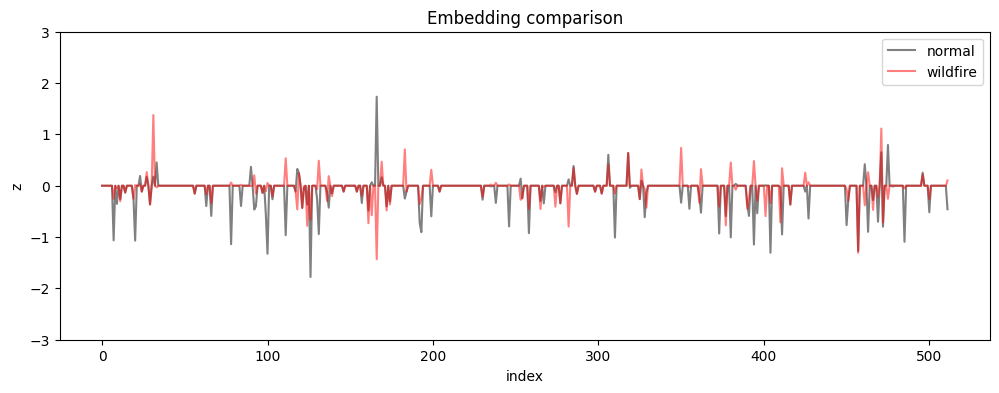

In [244]:
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(12, 4), squeeze=True)
for e in z_train:
    ax.plot(e, c='gray', alpha=1, label='normal')
    break
for e in z_test:
    ax.plot(e, c='r', alpha=.5, label='wildfire')
    break
ax.legend()
ax.set_ylim((-3, 3))
ax.set_xlabel('index')
ax.set_ylabel('z')
ax.set_title('Embedding comparison')
plt.show()

---

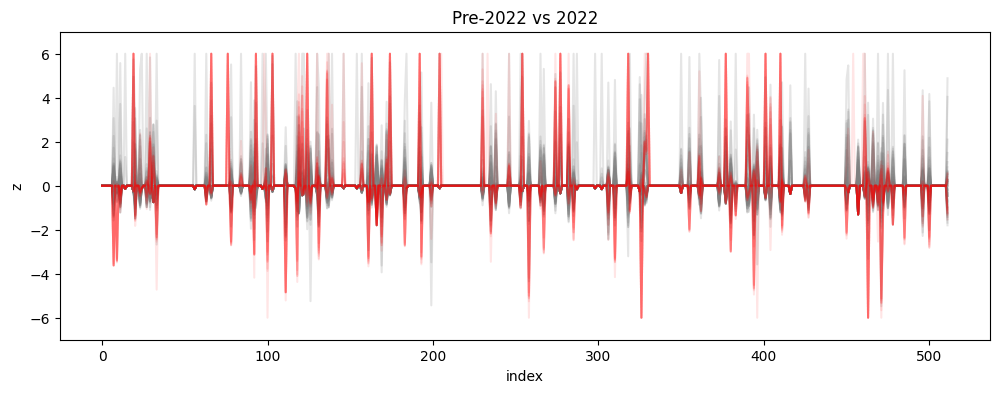

In [183]:
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(12, 4), squeeze=True)
for e in z_train:
    ax.plot(e, c='gray', alpha=0.2)
for e in z_test:
    ax.plot(e, c='r', alpha=0.1)
ax.set_ylim((-7, 7))
ax.set_xlabel('index')
ax.set_ylabel('z')
ax.set_title('Pre-2022 vs 2022')
plt.show()

### Clustering

In [184]:
from sklearn.manifold import TSNE

tsne = TSNE()
tsne.fit(np.concatenate([embeddings_train, embeddings_test]))

TSNE()

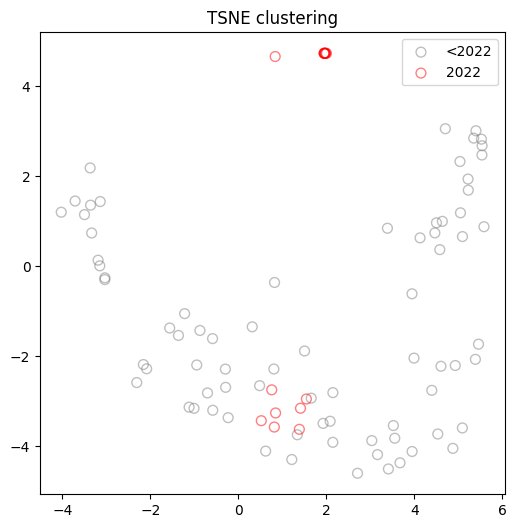

In [185]:
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(6, 6), squeeze=True)

tsne_emb_train = tsne.embedding_[:len(embeddings_train)]
ax.scatter(tsne_emb_train[:, 0], tsne_emb_train[:, 1], s=50, ec='gray', fc='none', alpha=0.5, label='<2022')

tsne_emb_test = tsne.embedding_[len(embeddings_train):]
ax.scatter(tsne_emb_test[:, 0], tsne_emb_test[:, 1], s=50, ec='red', fc='none', alpha=0.5, label='2022')

ax.legend()
ax.set_title('TSNE clustering')

plt.show()

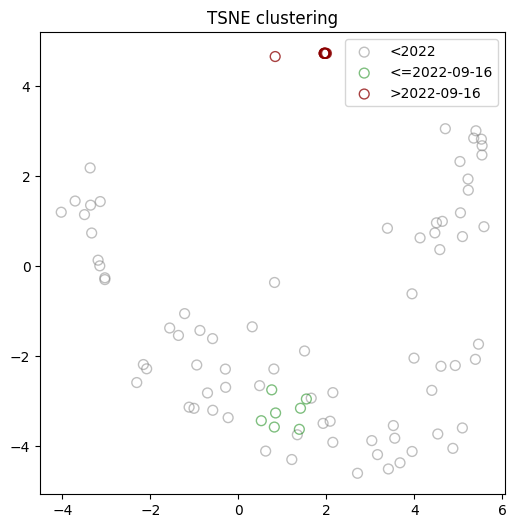

In [249]:
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(6, 6), squeeze=True)

tsne_emb_train = tsne.embedding_[:len(embeddings_train)]
ax.scatter(tsne_emb_train[:, 0], tsne_emb_train[:, 1], s=50, ec='gray', fc='none', alpha=0.5, label='<2022')

tsne_emb_test = tsne.embedding_[len(embeddings_train):]
ax.scatter(tsne_emb_test[:-8, 0], tsne_emb_test[:-8, 1], s=50, ec='green', fc='none', alpha=0.5, label='<=2022-09-16')
ax.scatter(tsne_emb_test[-8:, 0], tsne_emb_test[-8:, 1], s=50, ec='darkred', fc='none', alpha=0.75, label='>2022-09-16')

ax.legend()
ax.set_title('TSNE clustering')

plt.show()

---

### Statistical model

#### PCA

In [189]:
from sklearn.decomposition import PCA

In [258]:
pca = PCA()
pca.fit(z_train)

PCA()

In [192]:
inds_2020 = np.where([s.startswith('2020-') for s in t_strs])[0]
inds_2021 = np.where([s.startswith('2021-') for s in t_strs])[0]

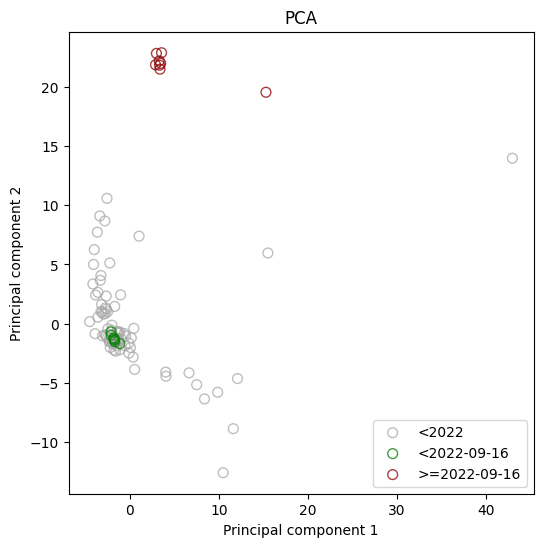

In [266]:
plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(6, 6), squeeze=True)

pca_emb_train = pca.transform(z_train)
ax.scatter(pca_emb_train[:, 0], pca_emb_train[:, 1], s=50, ec='darkgray', fc='none', alpha=0.75, label='<2022')

pca_emb_test = pca.transform(z_test)
ax.scatter(pca_emb_test[:-8, 0], pca_emb_test[:-8, 1], s=50, ec='green', fc='none', alpha=0.75, label='<2022-09-16')
ax.scatter(pca_emb_test[-8:, 0], pca_emb_test[-8:, 1], s=50, ec='darkred', fc='none', alpha=0.75, label='>=2022-09-16')

ax.legend(loc='lower right')
ax.set_title('PCA')
ax.set_xlabel('Principal component 1')
ax.set_ylabel('Principal component 2')

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

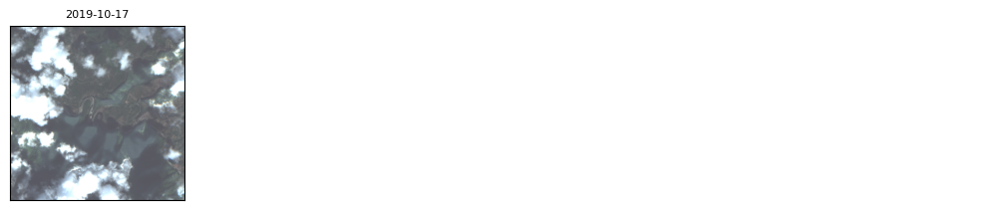

In [209]:
plt.close('all')

skip = 1
ts = [32]
t_strs_ = t_strs[ts]

ncols = 5
nrows = int(math.ceil(len(ts) / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(ts, t_strs_, axs.flat), total=len(ts)) as bar:
    for i, (t, t_str_t, ax) in enumerate(bar):
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if i < len(axs.flat) - 1:
    for ax in axs.flat[i + 1:]:
        ax.axis('off')
plt.show()

#### Gaussian Mixture Models

In [201]:
import matplotlib as mpl
from matplotlib.colors import LogNorm

def make_ellipses(gmm, ax, colors, alpha=0.2):
    for n, color in enumerate(colors):
#         cov_type = gmm.covariance_type
#         if cov_type == "full":
#             covariances = gmm.covariances_[n][:2, :2]
#         elif cov_type == "tied":
#             covariances = gmm.covariances_[:2, :2]
#         elif cov_type == "diag":
#             covariances = np.diag(gmm.covariances_[n][:2])
#         elif cov_type == "spherical":
#             covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]

#         v, w = np.linalg.eigh(covariances)
#         u = w[0] / np.linalg.norm(w[0])
#         angle = np.arctan2(u[1], u[0])
#         angle = 180 * angle / np.pi  # convert to degrees
#         v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
#         ell = mpl.patches.Ellipse(
#             gmm.means_[n, :2], v[0], v[1], angle=180 + angle, color=color, 
#             alpha=alpha
#         )
#         ell.set_clip_box(ax.bbox)
#         ax.add_artist(ell)
#         ax.set_aspect("equal", "datalim")
        ax.scatter(
            gmm.means_[n, 0], gmm.means_[n, 1], s=40, ec='k', fc='k', alpha=1.)
        
    # display predicted scores by the model as a contour plot
    x = np.linspace(-20.0, 50.0)
    y = np.linspace(-20.0, 40.0)
    X, Y = np.meshgrid(x, y)
    XX = np.array([X.ravel(), Y.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X.shape)

    ax.contourf(
        X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 20),
        cmap='plasma_r', alpha=alpha
    )
    ax.axis('tight')

In [199]:
from sklearn.mixture import GaussianMixture

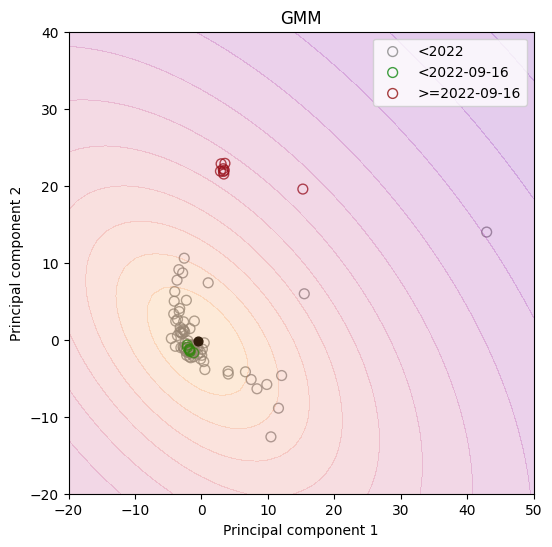

In [264]:
k = 1
gmm = GaussianMixture(n_components=k, covariance_type='full')
gmm.fit(pca_emb_train[np.arange(len(embeddings_train)) != 32, :2])

plt.close('all')
fig, ax = plt.subplots(1, 1, figsize=(6, 6), squeeze=True)

pca_emb_train = pca.transform(z_train)
ax.scatter(pca_emb_train[:, 0], pca_emb_train[:, 1], s=50, ec='gray', fc='none', alpha=0.75, label='<2022')

pca_emb_test = pca.transform(z_test)
ax.scatter(pca_emb_test[:-8, 0], pca_emb_test[:-8, 1], s=50, ec='green', fc='none', alpha=0.75, label='<2022-09-16')
ax.scatter(pca_emb_test[-8:, 0], pca_emb_test[-8:, 1], s=50, ec='darkred', fc='none', alpha=0.75, label='>=2022-09-16')

make_ellipses(gmm, ax, colors=['gray', 'cyan', 'orange'][:k])

ax.legend()
ax.set_title('GMM')
ax.set_xlabel('Principal component 1')
ax.set_ylabel('Principal component 2')

plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

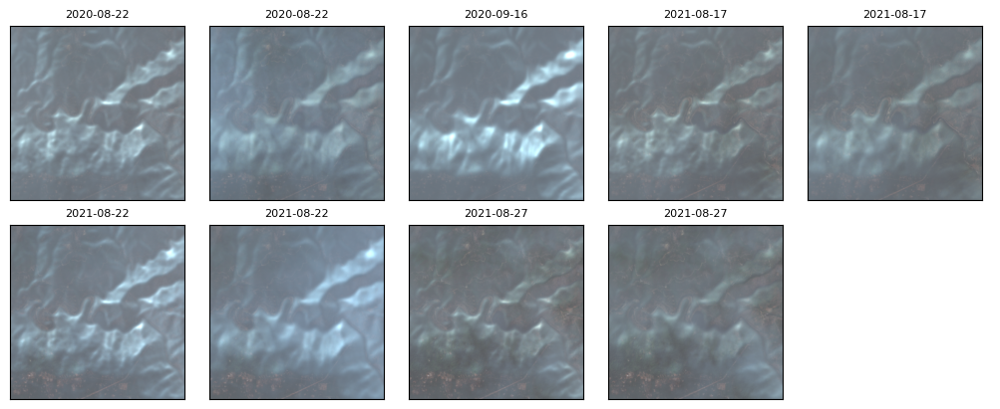

In [241]:
plt.close('all')

skip = 1
ts = np.where((pca_emb_train[:, 0] > 1) & (pca_emb_train[:, 1] < 0))[0]
t_strs_ = t_strs[ts]

ncols = 5
nrows = int(math.ceil(len(ts) / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(ts, t_strs_, axs.flat), total=len(ts)) as bar:
    for i, (t, t_str_t, ax) in enumerate(bar):
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if i < len(axs.flat) - 1:
    for ax in axs.flat[i + 1:]:
        ax.axis('off')
plt.show()

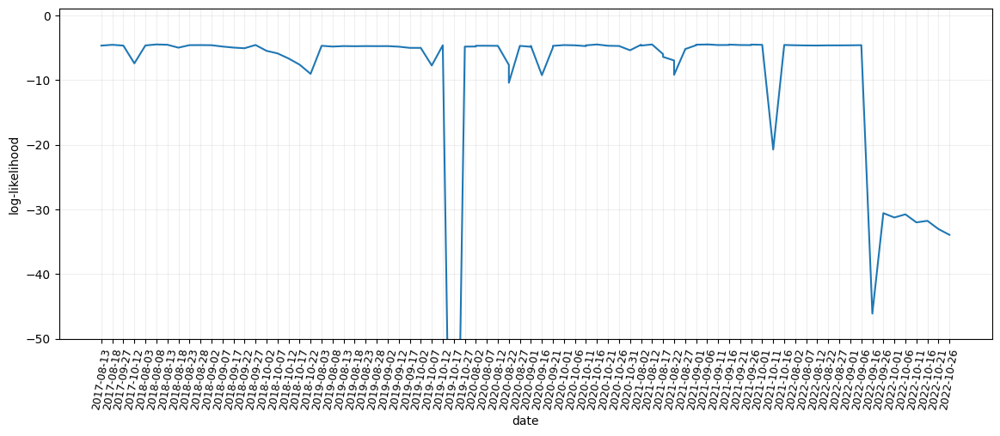

In [270]:
fig, ax = plt.subplots(1, 1, figsize=(14, 5), squeeze=True)
s = gmm.score_samples(np.concatenate((pca_emb_train, pca_emb_test), axis=0)[:, :2])
ax.plot(t_strs, s)
ax.xaxis.set_tick_params(rotation=80, labelsize=9)
ax.set_ylim((-50, None))
ax.grid('k', alpha=0.2)
ax.set_xlabel('date')
ax.set_ylabel('log-likelihood')
plt.show()

---

# Future work

- Use correct imagery (Sentinel-2 L1C)
- Handle clouds
- Handle seasonal variation
- How to update model?